# Reading and working with Point cloud Data

## Important Links

1. [Tutorial](https://www.youtube.com/watch?v=s3Ma12Yg-hc)
2. [Data source](https://portal.opentopography.org)
3. [Surface Generation](https://thinkinfi.com/3d-digital-surface-model-with-python-and-pylidar/)

In [7]:
import numpy as np
import pandas as pd
import laspy
from scipy import stats

# Data visualization tools
from matplotlib import pyplot as plt
import seaborn as sns
import open3d as o3d

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


---
### Read Data

In [14]:
las = laspy.read('../data/Smaller Points.las')

---
### Explore Data and view metadata

In [15]:
list(las.point_format.dimension_names)

['X',
 'Y',
 'Z',
 'intensity',
 'return_number',
 'number_of_returns',
 'scan_direction_flag',
 'edge_of_flight_line',
 'classification',
 'synthetic',
 'key_point',
 'withheld',
 'scan_angle_rank',
 'user_data',
 'point_source_id',
 'gps_time']

#### Point classification meanings

0. Never Classified
1. Unassigned
2. Ground
3. Low Vegitation
4. Medium Vegitation
5. High Vegitation
6. Building
7. Low Point
8. Reserved
9. Water
10. Rail
11. Road Surface
12. Reserved
13. Wire Guard (Shield)
14. Wire Conductor (Phase)
15. Transmission Tower
16. Wire-Structure Connector (Insulator)
17. Bridge Deck
18. High Noise
19-63. Reserved
64-255. 

User Definable

In [16]:
set(list(las.classification))

{1, 2, 7}

---
### Create a 3D point cloud Data

In [17]:
point_data = np.stack([las.X, las.Y, las.Z], axis=0).transpose((1, 0))
df = pd.DataFrame(point_data)
df.rename({0: 'X', 1: 'Y',   2: 'Z'}, inplace=True, axis=1)
df

,X,Y,Z
0,50391098,481201868,254735
1,50391262,481201934,253735
2,50391113,481202380,252758
3,50391117,481202301,253247
4,50391159,481202241,253479
...,...,...,...
4433780,50514077,481203902,256352
4433781,50514172,481203897,256398
4433782,50514257,481203901,256385
4433783,50514346,481203904,256384


---
### Visualizing uncleaned data

In [18]:
geom = o3d.geometry.PointCloud()
geom.points = o3d.utility.Vector3dVector(point_data)
o3d.visualization.draw_geometries([geom], left=0, top=40)

---
### Data Cleaning

#### Data Features Visualization

<Axes: ylabel='Z'>

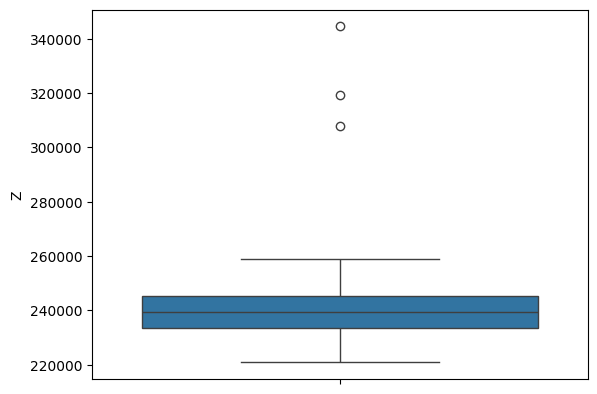

In [ ]:
sns.boxplot(df['Z'])

#### Removing outliers using zIndex

<Axes: ylabel='Z'>

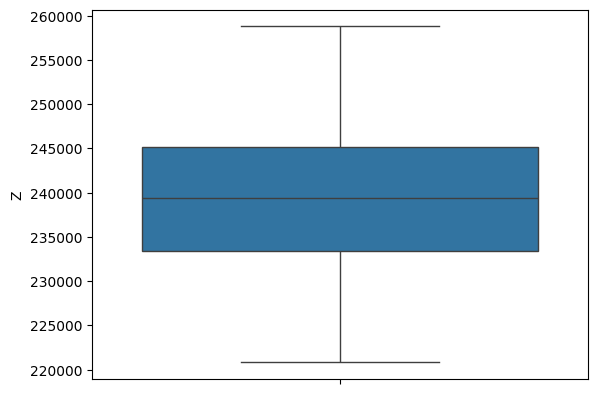

In [ ]:
zindex = (np.abs(stats.zscore(df)) < 3).all(axis=1)
df = df[zindex]
sns.boxplot(df['Z'])

#### Normalizing Data

In [ ]:
points = df.to_numpy()
points = np.float64(points)
centroid = np.mean(points, axis=0)
points -= centroid
furthest_distance = np.max(np.sqrt(np.sum(abs(points)**2,axis=-1)))
points /= furthest_distance

df = pd.DataFrame(points)
df.rename({0: 'X', 1: 'Y',   2: 'Z'}, inplace=True, axis=1)
df

,X,Y,Z
0,-0.679398,0.421268,0.192455
1,-0.677339,0.422096,0.179899
2,-0.679210,0.427696,0.167633
3,-0.679160,0.426704,0.173772
4,-0.678632,0.425951,0.176685
...,...,...,...
4433777,0.864650,0.446805,0.212757
4433778,0.865842,0.446742,0.213334
4433779,0.866909,0.446793,0.213171
4433780,0.868027,0.446830,0.213159


---
### Visualizing the Data using Open3D

#### All data visualization

In [ ]:
data = df.to_numpy()
geom = o3d.geometry.PointCloud()
geom.points = o3d.utility.Vector3dVector(data)
o3d.visualization.draw_geometries([geom], left=0, top=40)

#### Ground data visualization

In [ ]:
ground = laspy.create(point_format=las.header.point_format, file_version=las.header.version)
ground.points = las.points[las.classification == 2]

ground_data = np.stack([ground.X, ground.Y, ground.Z], axis=0).transpose((1, 0))
ground_geom = o3d.geometry.PointCloud()
ground_geom.points = o3d.utility.Vector3dVector(ground_data)
o3d.visualization.draw_geometries([ground_geom], left=0, top=40)

---
### Surface construction for ground Data

#### Down sample data

In [ ]:
down_sample, arr, vect = ground_geom.voxel_down_sample_and_trace(2000, ground_geom.get_min_bound(), ground_geom.get_max_bound())
o3d.visualization.draw_plotly([down_sample], width=1000, height=500, window_name="Point Cloud Data", front=(1,-1.2,0.7), zoom=0.18)

#### Estimate normals for data and reorient them

In [ ]:
down_sample.estimate_normals()
down_sample.orient_normals_consistent_tangent_plane(k=15)

#### Add Estimated normals to point cloud

In [ ]:
# o3d.visualization.draw_plotly([down_sample], width=1000, height=500)
o3d.visualization.draw_geometries([down_sample], point_show_normal=True, left=0, top=40)

#### Construct surface using ball point normalization

In [ ]:
radii = list(np.arange(1530, 2000, 100))
ball_point_surface = o3d.geometry.TriangleMesh.create_from_point_cloud_ball_pivoting(down_sample, o3d.utility.DoubleVector(radii))
ball_point_surface.compute_vertex_normals()
o3d.visualization.draw_plotly([down_sample, ball_point_surface], width=1000, height=500, front=(1,-1.2,0.7), zoom=0.18)
# o3d.visualization.draw_geometries([down_sample, surface], mesh_show_back_face=True, mesh_show_wireframe=True, point_show_normal=True, left=0, top=50)

#### Construct surface using Alpha shapes

In [ ]:
tetra_mesh, pt_map = o3d.geometry.TetraMesh.create_from_point_cloud(down_sample)
for alpha in [10000, 20000, 30000, 40000]:
    \
    alpha_shapes_surface = o3d.geometry.TriangleMesh.create_from_point_cloud_alpha_shape(down_sample, alpha, tetra_mesh, pt_map)
    alpha_shapes_surface.compute_vertex_normals()
    # o3d.visualization.draw_geometries([down_sample, alpha_shapes_surface], left=0, top=40, point_show_normal=True)
    print("Alpha => ", alpha)
    o3d.visualization.draw_plotly([down_sample, alpha_shapes_surface], width=1000, height=500, front=(1,-1.2,0.7), zoom=0.18)

Alpha =>  10000


Alpha =>  20000


Alpha =>  30000


Alpha =>  40000


#### Good point cloud for alpha shapes

In [ ]:
car_wheel = o3d.io.read_point_cloud('../data/car-wheel-cap-ply/Car wheel cap.ply')
car_wheel = car_wheel.random_down_sample(0.1)

alpha_shapes_surface_example = o3d.geometry.TriangleMesh.create_from_point_cloud_alpha_shape(car_wheel, 20)
alpha_shapes_surface_example.compute_vertex_normals()

o3d.visualization.draw_plotly([alpha_shapes_surface_example], width=1000, height=500)

#### Construct surface using Poisson surface reconstruction

In [ ]:
poisson_surface, densities = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(down_sample, depth=9)
o3d.visualization.draw_plotly([down_sample, poisson_surface], width=1000, height=500, front=(1,-1.2,0.7), zoom=0.18)
# o3d.visualization.draw_geometries([poisson_surface], left=0, top=40)

#### Visualizing the density of Poisson surface

In [ ]:
from open3d.web_visualizer import draw

print('visualize densities')
densities = np.asarray(densities)
density_colors = plt.get_cmap('plasma')(
    (densities - densities.min()) / (densities.max() - densities.min()))
density_colors = density_colors[:, :3]
density_mesh = o3d.geometry.TriangleMesh()
density_mesh.vertices = poisson_surface.vertices
density_mesh.triangles = poisson_surface.triangles
density_mesh.triangle_normals = poisson_surface.triangle_normals
density_mesh.vertex_colors = o3d.utility.Vector3dVector(density_colors)
# draw([down_sample, density_mesh], width=1080)
o3d.visualization.draw_geometries([down_sample, density_mesh], left=0, top=40)

[Open3D INFO] Resetting default logger to print to terminal.
visualize densities


In [ ]:
print('remove low density vertices')
vertices_to_remove = densities < np.quantile(densities, 0.1)
vertices_to_remove
poisson_surface.remove_vertices_by_mask(vertices_to_remove)
print(poisson_surface)
o3d.visualization.draw_plotly([down_sample, poisson_surface], width=1000, height=500, front=(1,-1.2,0.7), zoom=0.18)

remove low density vertices
TriangleMesh with 11949 points and 23503 triangles.


---
### Calculating Mesh area

#### Ball point normalization surface

In [ ]:
cluster_index, no_triangles, area_per_cluster = ball_point_surface.cluster_connected_triangles()
ball_point_total_mesh_area = np.sum(area_per_cluster) / (2*10**6)
print('Total Surface Area = {:.2e} sq.km.'.format(ball_point_total_mesh_area))

Total Surface Area = 4.90e+03 sq.km.


#### Alpha Shape surface

In [ ]:
cluster_index, no_triangles, area_per_cluster = alpha_shapes_surface.cluster_connected_triangles()
alpha_shape_total_mesh_area = np.sum(area_per_cluster) / (2*10**6)
print('Total Surface Area = {:.2e} sq.km.'.format(alpha_shape_total_mesh_area))

Total Surface Area = 9.56e+03 sq.km.


#### Poission surface

In [ ]:
cluster_index, no_triangles, area_per_cluster = poisson_surface.cluster_connected_triangles()
poisson_total_mesh_area = np.sum(area_per_cluster) / (2*10**6)
print('Total Surface Area = {:.2e} sq.km.'.format(poisson_total_mesh_area))

Total Surface Area = 4.97e+03 sq.km.


#### Average Area for the given land sample 

In [ ]:
print("Average Area = {:.2e} sq.km.".format((ball_point_total_mesh_area+ poisson_total_mesh_area) / 2))

Average Area = 4.93e+03 sq.km.
